# Clustering and dimeonsionality reduction techniques combined


In this notebook, we show how the clustering performance changes when dimensionality reduction techniques like Principal component analysis (PCA), Independent component analysis (ICA), or Random projections (RP) is combined with algorithms like k-means.

[Read about ___k-means clustering algorithm___ here.](https://en.wikipedia.org/wiki/K-means_clustering)

[Read about ___principal component analysis___ here](https://en.wikipedia.org/wiki/Principal_component_analysis)

[Read about ___independent component analysis___ here](https://en.wikipedia.org/wiki/Independent_component_analysis)

---

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Create synthetic data using Scikit learn `make_blob` method

- Number of features: 8
- Number of clusters: 5
- Number of samples: 1000

In [2]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [3]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [4]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [5]:
d1 = data1[0]

In [6]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-8.845745,-10.125938,6.190865,2.114237,-1.118722,6.971029,-3.751338,0.374982
1,-4.545496,6.821160,-11.391919,7.258098,-8.700119,-8.606888,-0.334037,-4.272944
2,5.601356,4.042297,-5.790314,-5.011526,5.790015,0.712883,-5.381596,7.084663
3,-0.435955,4.055936,7.616170,-0.322162,-9.067382,2.255030,-5.303677,-8.861893
4,0.949412,8.861595,-6.035052,-2.825423,3.983559,-5.014250,-3.679382,1.418247


In [7]:
from itertools import combinations

In [8]:
lst_vars=list(combinations(df1.columns,2))

In [9]:
len(lst_vars)

28

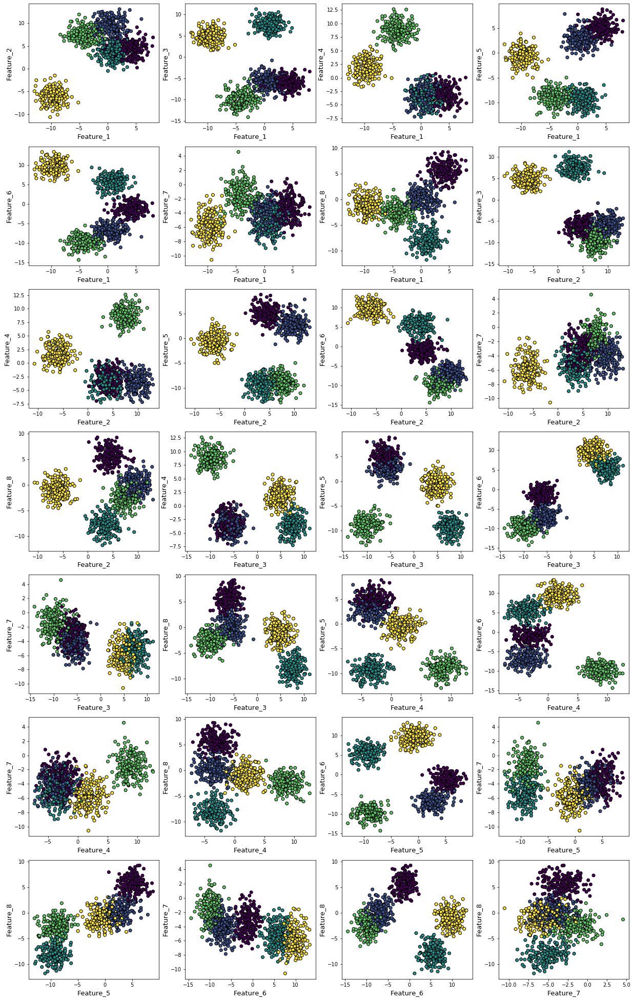

In [10]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [11]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,-1.605636,5.002291,-12.920590,-5.147696,-0.325910,2.095238,8.035348
Feature_2,1000.0,3.823645,5.592849,-10.679017,2.181139,4.968569,8.017429,13.079614
Feature_3,1000.0,-1.876754,6.945315,-14.095301,-7.400031,-4.853157,5.485509,11.217853
Feature_4,1000.0,0.101590,4.995570,-7.275493,-3.660752,-1.860735,2.769558,12.620380
Feature_5,1000.0,-2.210752,6.073568,-12.968299,-8.625808,-0.790882,3.330146,8.851106
Feature_6,1000.0,-0.557101,7.439982,-14.351379,-7.719647,-1.085499,6.607005,13.325440
Feature_7,1000.0,-3.980643,2.161621,-10.576757,-5.530282,-4.064495,-2.560426,4.565050
Feature_8,1000.0,-1.129244,4.654406,-11.807617,-3.619062,-1.174020,1.616544,9.280824


### How are the classes separated (boxplots)

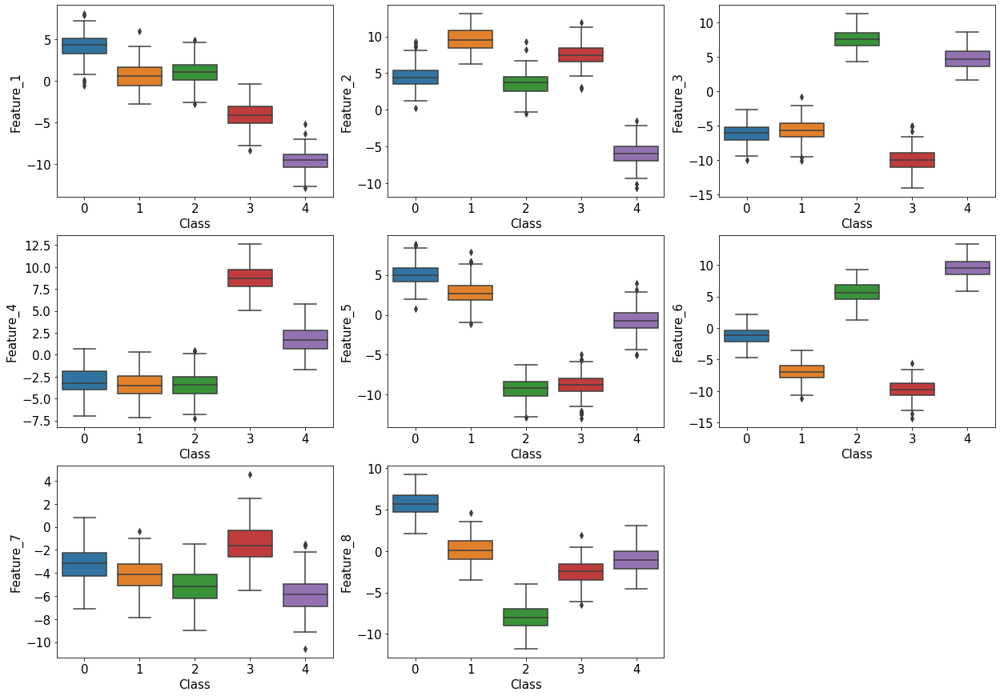

In [12]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

## k-means clustering

In [13]:
from sklearn.cluster import KMeans

### Unlabled data

In [14]:
X=df1

In [15]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-8.845745,-10.125938,6.190865,2.114237,-1.118722,6.971029,-3.751338,0.374982
1,-4.545496,6.821160,-11.391919,7.258098,-8.700119,-8.606888,-0.334037,-4.272944
2,5.601356,4.042297,-5.790314,-5.011526,5.790015,0.712883,-5.381596,7.084663
3,-0.435955,4.055936,7.616170,-0.322162,-9.067382,2.255030,-5.303677,-8.861893
4,0.949412,8.861595,-6.035052,-2.825423,3.983559,-5.014250,-3.679382,1.418247


In [16]:
y=data1[1]

### Scaling

In [17]:
from sklearn.preprocessing import MinMaxScaler

In [18]:
scaler = MinMaxScaler()

In [19]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [20]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [21]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -267.08474492227174
Silhouette score for number of cluster(s) 2: 0.44865376237077215
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -139.07804619334965
Silhouette score for number of cluster(s) 3: 0.5739677228026345
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -60.73580829107304
Silhouette score for number of cluster(s) 4: 0.6677801957394591
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -40.2347941797633
Silhouette score for number of cluster(s) 5: 0.610931115563045
V-measure score for number of cluster(s)

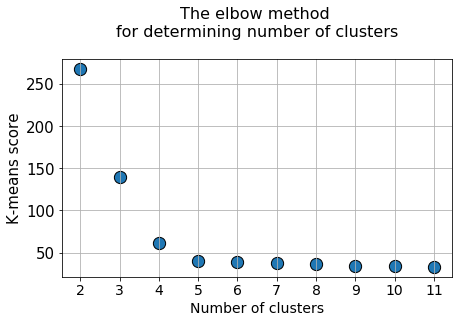

In [25]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()

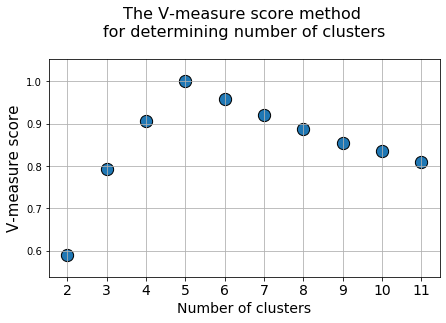

In [26]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()

In [27]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [28]:
preds_km = km.predict(X_scaled)

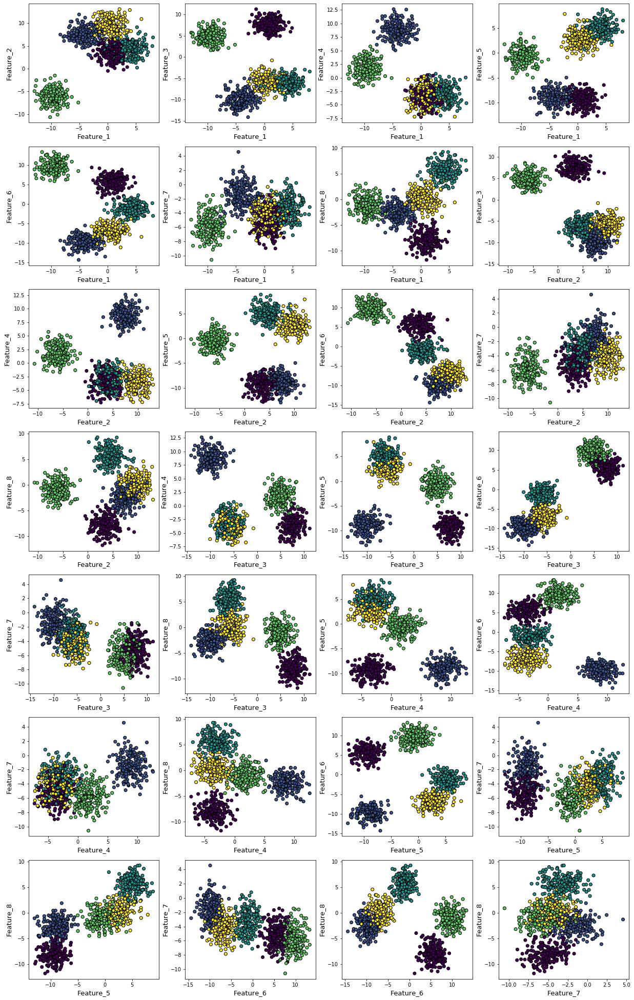

In [29]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

In [30]:
from sklearn.mixture import GaussianMixture

In [31]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -13292.354803793565
Log-likelihood score for number of cluster(s) 2: 6.953572511811488
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -14734.231285216134
Log-likelihood score for number of cluster(s) 3: 7.82993524629987
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -15403.737926069727
Log-likelihood score for number of cluster(s) 4: 8.320113060503765
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -15593.094470211061
Log-likelihood score for number of cluster(s) 5: 8.57021582635153
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -15347.431229461456
Log-likelihood score for number of cluster(s) 6: 8.602808699753824
---

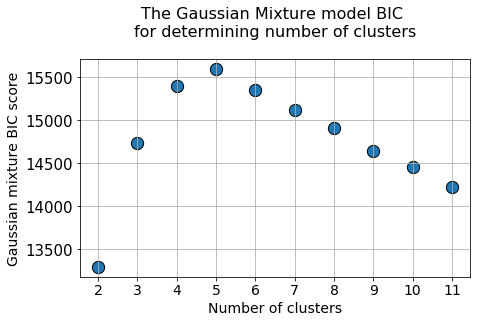

In [33]:
plt.figure(figsize=(7,4))
plt.title("The Gaussian Mixture model BIC \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("Gaussian mixture BIC score",fontsize=14)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)
plt.show()

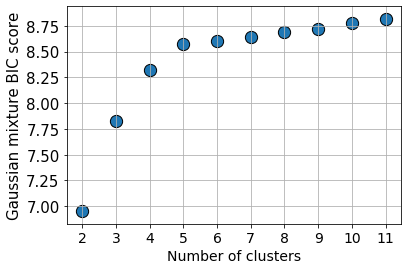

In [34]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("Gaussian mixture BIC score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)
plt.show()

In [35]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

Initialization 0
Initialization converged: True
Initialization 1
Initialization converged: True
Initialization 2
Initialization converged: True
Initialization 3
Initialization converged: True
Initialization 4
Initialization converged: True
Initialization 5
Initialization converged: True
Initialization 6
Initialization converged: True
Initialization 7
Initialization converged: True
Initialization 8
Initialization converged: True
Initialization 9
Initialization converged: True


In [36]:
gm.means_

array([[0.15899484, 0.19549688, 0.74435654, 0.45443772, 0.56381748,
        0.8631279 , 0.31091461, 0.51025688],
       [0.81602585, 0.63711689, 0.31647742, 0.21209084, 0.82539836,
        0.47599622, 0.48663184, 0.82985503],
       [0.42119086, 0.76526479, 0.1639735 , 0.80635766, 0.18796567,
        0.16544431, 0.60021041, 0.44075837],
       [0.64251409, 0.85387675, 0.33303496, 0.18915346, 0.71976276,
        0.26747649, 0.42359813, 0.56827383],
       [0.66108219, 0.60019436, 0.85562527, 0.19189739, 0.16825357,
        0.72011058, 0.35679706, 0.18282367]])

In [37]:
km.cluster_centers_

array([[0.66108219, 0.60019436, 0.85562527, 0.19189739, 0.16825357,
        0.72011058, 0.35679706, 0.18282367],
       [0.42119086, 0.76526479, 0.1639735 , 0.80635766, 0.18796567,
        0.16544431, 0.60021041, 0.44075837],
       [0.81598194, 0.63722911, 0.31643734, 0.21218196, 0.82543269,
        0.4759198 , 0.48667959, 0.82983917],
       [0.15899484, 0.19549688, 0.74435654, 0.45443772, 0.56381748,
        0.8631279 , 0.31091461, 0.51025688],
       [0.6424514 , 0.85389771, 0.33308522, 0.18904824, 0.71966353,
        0.2674248 , 0.42351165, 0.56812898]])

In [38]:
gm.means_/km.cluster_centers_

array([[0.24050692, 0.32572261, 0.86995624, 2.36812864, 3.35099861,
        1.19860466, 0.87140463, 2.79097822],
       [1.93742537, 0.83254437, 1.93005224, 0.26302328, 4.3912188 ,
        2.8770782 , 0.81076876, 1.88278905],
       [0.51617669, 1.20092567, 0.51818632, 3.80031204, 0.22771774,
        0.34763065, 1.23327629, 0.5311371 ],
       [4.04110023, 4.36772576, 0.44741322, 0.41623626, 1.27658823,
        0.30989207, 1.36242595, 1.11370146],
       [1.02899953, 0.7028879 , 2.5687879 , 1.01507105, 0.23379477,
        2.69275916, 0.84247282, 0.32179958]])

In [39]:
preds_gm=gm.predict(X_scaled)

In [40]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [41]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [42]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [43]:
silhouette_score(X_scaled,preds_km)

0.610931115563045

In [44]:
silhouette_score(X_scaled,preds_gm)

0.610931115563045

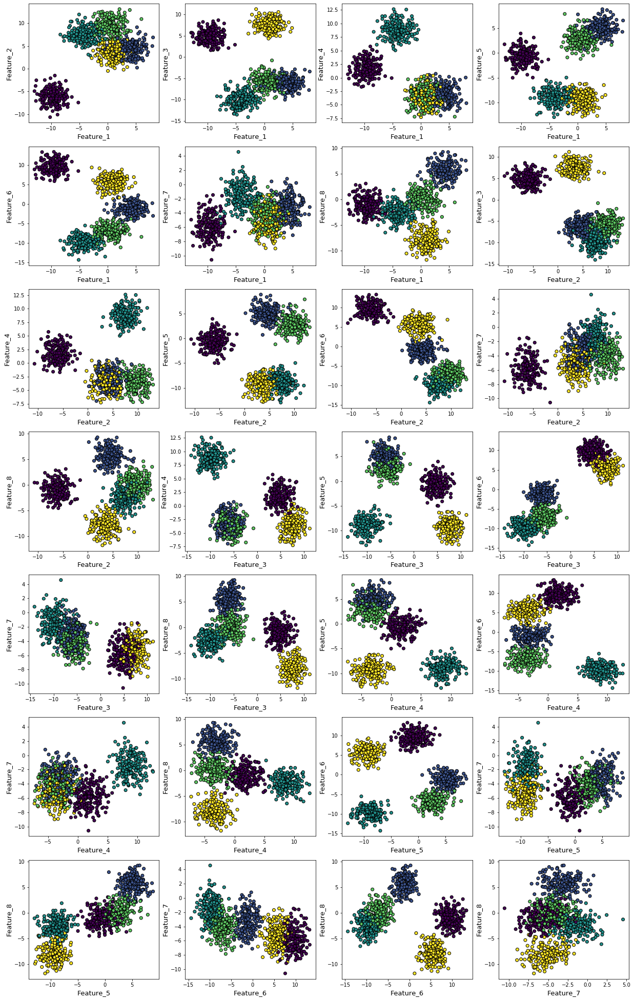

In [45]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## PCA

In [46]:
from sklearn.decomposition import PCA

In [47]:
n_prin_comp = 3

In [48]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [49]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [50]:
pca_explained_var = pca_full.explained_variance_ratio_

In [51]:
cum_explaiend_var = pca_explained_var.cumsum()

In [52]:
cum_explaiend_var

array([0.44178385, 0.73688074, 0.91746907, 0.95491718, 0.97317445,
       0.98394426, 0.99312042, 1.        ])

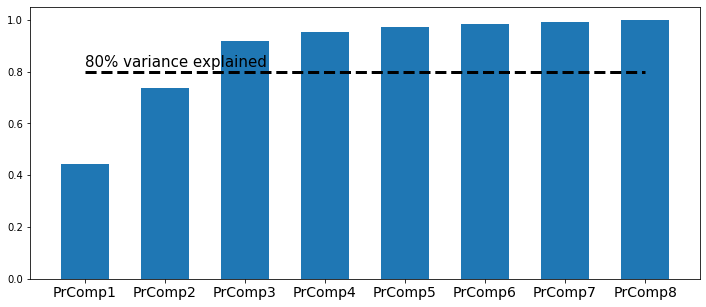

In [53]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [54]:
X_pca = pca_partial.fit_transform(X_scaled)

In [55]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [56]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -228.38191238434445
Silhouette score for number of cluster(s) 2: 0.5150714474106947
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -100.78134581223378
Silhouette score for number of cluster(s) 3: 0.6741600177036848
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -23.054801794619408
Silhouette score for number of cluster(s) 4: 0.7982251899579034
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -13.452592528249882
Silhouette score for number of cluster(s) 5: 0.7098101194661651
V-measure score for number of cluster

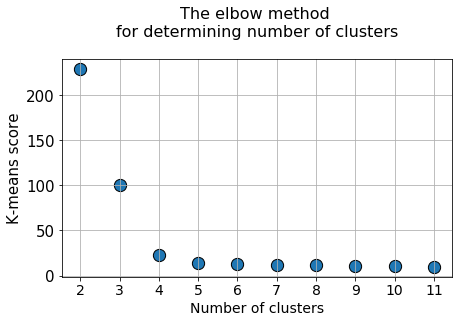

In [58]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()


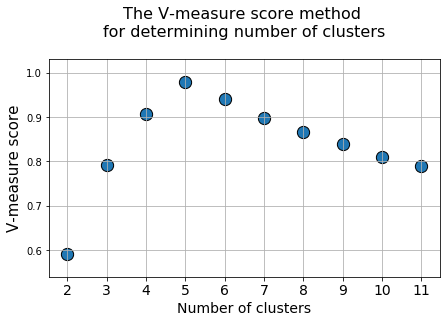

In [60]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()


### K-means fitting with PCA-transformed data

In [61]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [62]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

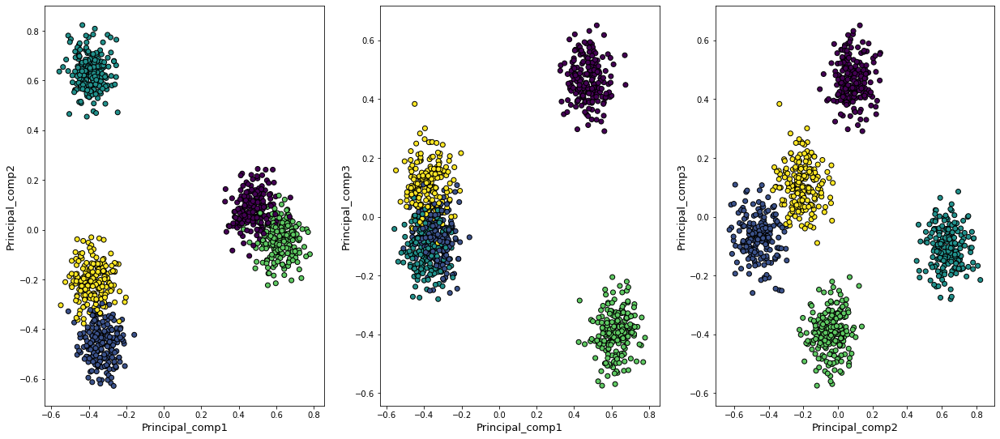

In [63]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## ICA

In [90]:
from sklearn.decomposition import FastICA

In [91]:
n_ind_comp = 3

In [92]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
        n_components=3, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [93]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

/Users/larissahubschneider/anaconda3/envs/ds1-copy1/lib/python3.6/site-packages/sklearn/decomposition/_fastica.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
        n_components=None, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [94]:
X_ica = ica_partial.fit_transform(X_scaled)

In [95]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Running k-means on the independent features

In [96]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.046791563089058
Silhouette score for number of cluster(s) 2: 0.42399485082435884
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.0883996233642792
Silhouette score for number of cluster(s) 3: 0.6044304472765866
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.1933185241712299
Silhouette score for number of cluster(s) 4: 0.7882904851489589
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.11034469277385826
Silhouette score for number of cluster(s) 5: 0.7135639514076152
V-measure score for number of cluste

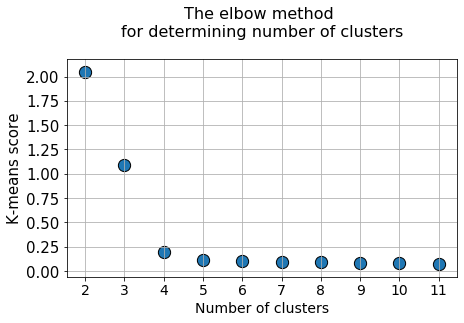

In [97]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()


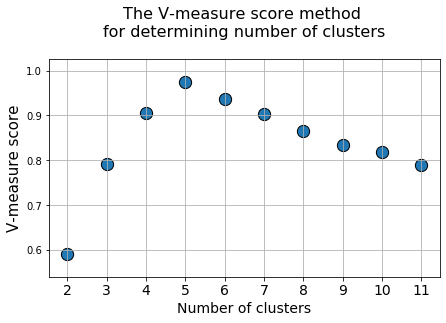

In [98]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()



### K-means fitting with ICA-transformed data

In [99]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [100]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

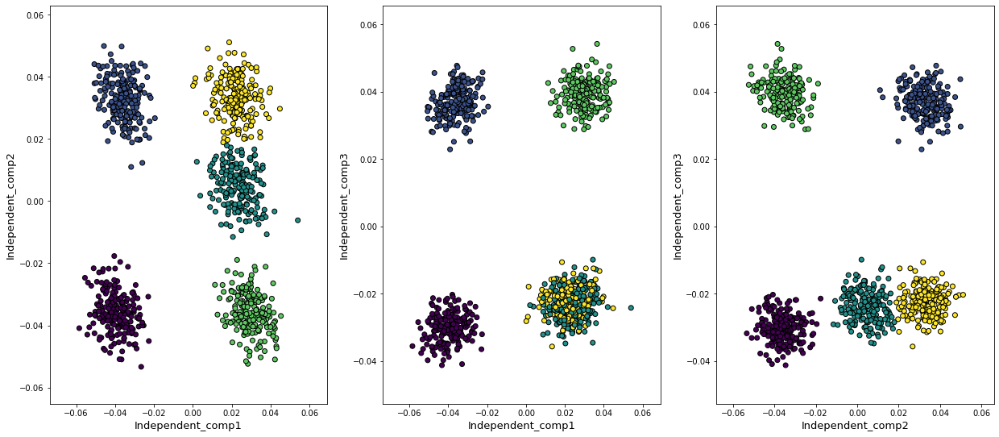

In [101]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [102]:
from sklearn.random_projection import GaussianRandomProjection

In [103]:
n_random_comp = 3

In [104]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [105]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [106]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [107]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -120.28796816692912
Silhouette score for number of cluster(s) 2: 0.7039984084768944
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -70.80317766117659
Silhouette score for number of cluster(s) 3: 0.61358880912017
V-measure score for number of cluster(s) 3: 0.7874634599826422
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -51.57565755084889
Silhouette score for number of cluster(s) 4: 0.49729637562671875
V-measure score for number of cluster(s) 4: 0.8211252754371903
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -40.85837191706807
Silhouette score for number of cluster(s) 5: 0.4281364131757344
V-measure score for number of cluster(s) 

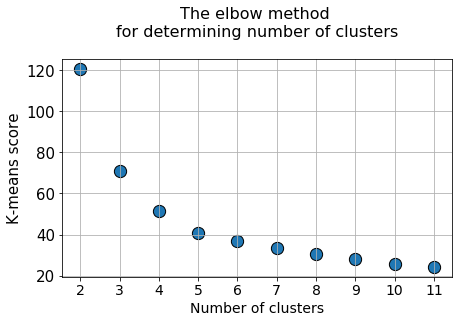

In [108]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()


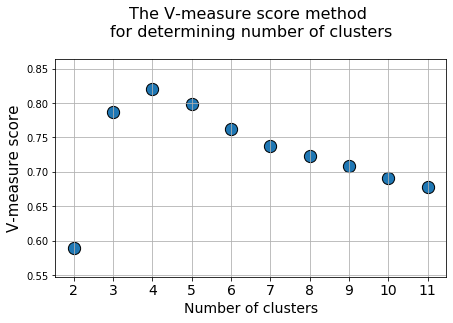

In [109]:
plt.figure(figsize=(7,4))
plt.title("The V-measure score method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("V-measure score",fontsize=15)
plt.xticks([i for i in range(2,12)],fontsize=14)
plt.show()


### K-means fitting with random-projected data

In [110]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [111]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

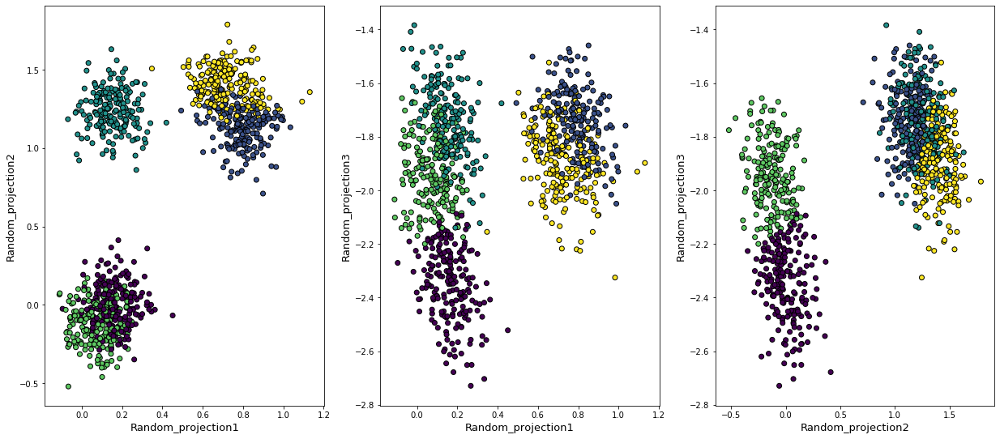

In [112]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [113]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -30.66374116396205
Silhouette score for iteration 0: 0.4531534421353741
V-measure score for iteration 0: 0.8480736452019824
----------------------------------------------------------------------------------------------------


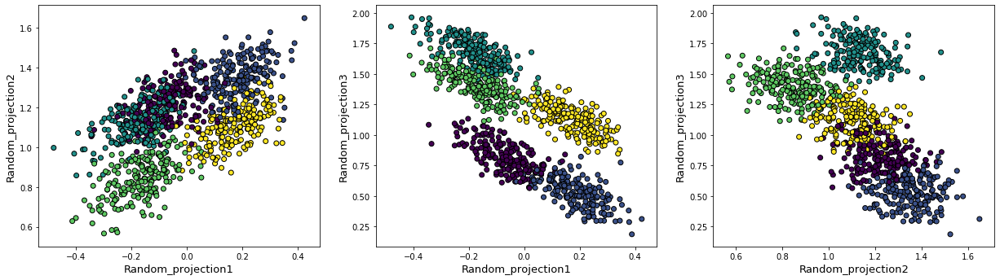

Score for iteration 1: -24.73687940351198
Silhouette score for iteration 1: 0.6207240155574265
V-measure score for iteration 1: 0.9645879492592581
----------------------------------------------------------------------------------------------------


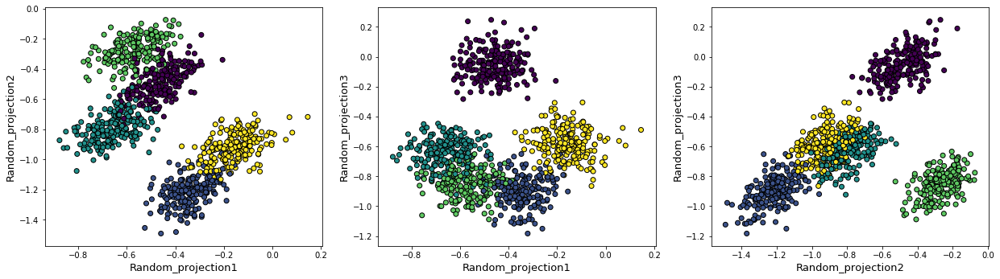

Score for iteration 2: -49.91123158260845
Silhouette score for iteration 2: 0.550995999378367
V-measure score for iteration 2: 0.8759447720336706
----------------------------------------------------------------------------------------------------


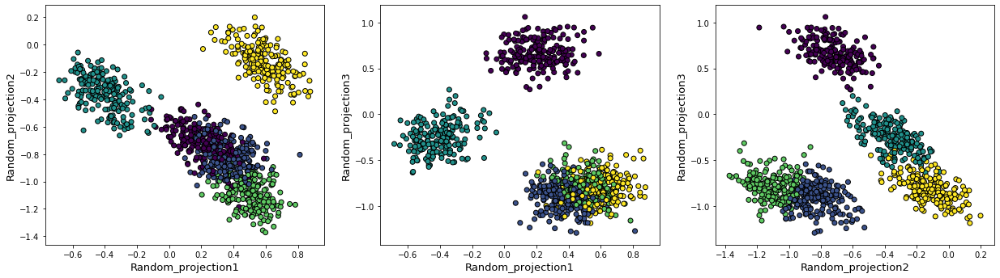

Score for iteration 3: -23.74895035126669
Silhouette score for iteration 3: 0.5221541821902204
V-measure score for iteration 3: 0.8336265464492765
----------------------------------------------------------------------------------------------------


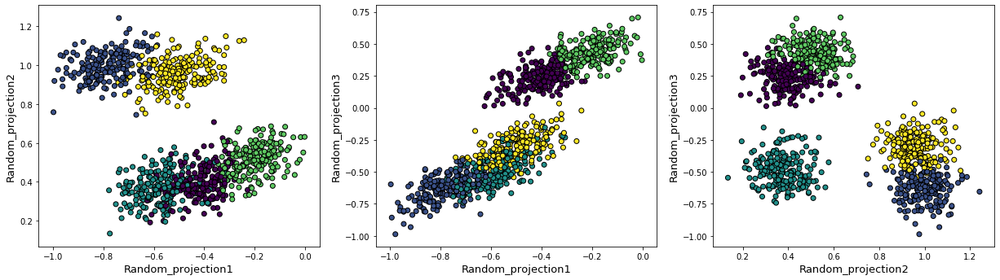

Score for iteration 4: -47.19083989274058
Silhouette score for iteration 4: 0.5218619587219342
V-measure score for iteration 4: 0.8553121869843711
----------------------------------------------------------------------------------------------------


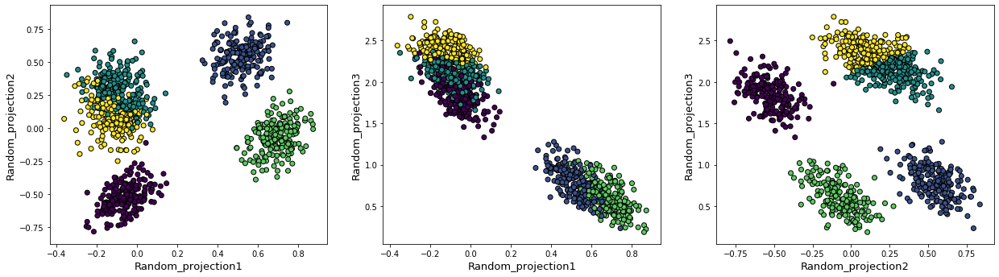

Score for iteration 5: -34.9328012936977
Silhouette score for iteration 5: 0.4052182135612968
V-measure score for iteration 5: 0.7500113089647875
----------------------------------------------------------------------------------------------------


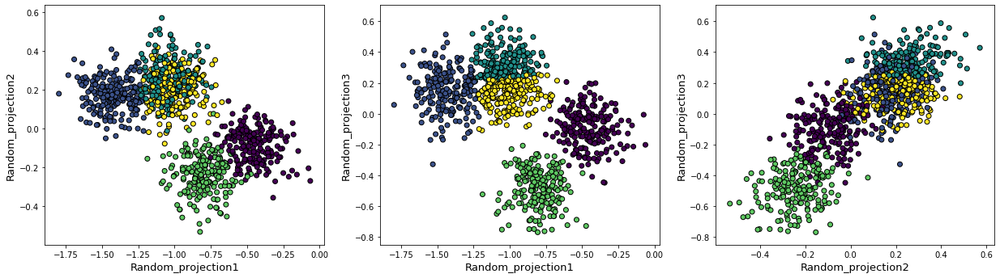

Score for iteration 6: -34.00081058658292
Silhouette score for iteration 6: 0.4542740143416082
V-measure score for iteration 6: 0.7924018651593309
----------------------------------------------------------------------------------------------------


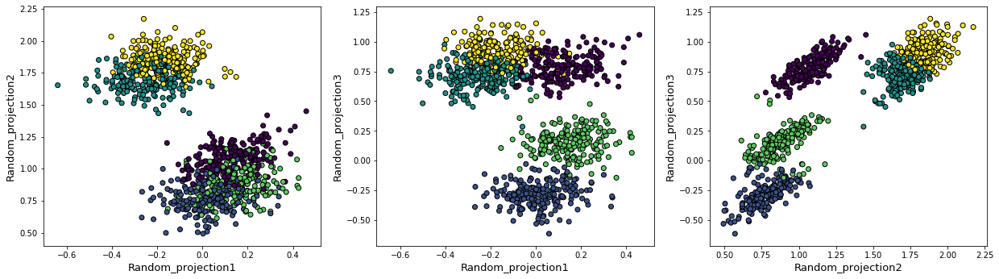

Score for iteration 7: -51.11131823443692
Silhouette score for iteration 7: 0.4310096903245242
V-measure score for iteration 7: 0.8442150113044863
----------------------------------------------------------------------------------------------------


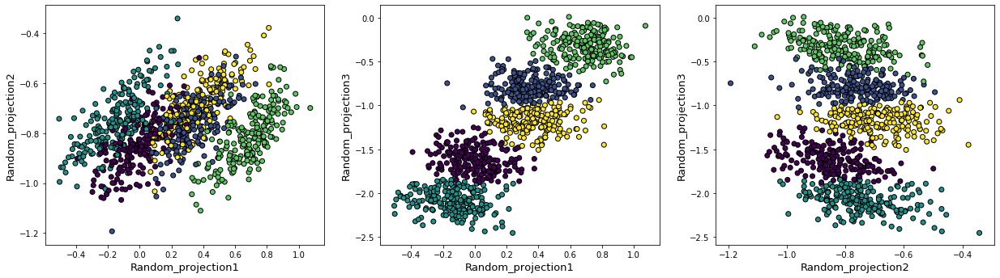

Score for iteration 8: -27.922557156007127
Silhouette score for iteration 8: 0.47538137673576025
V-measure score for iteration 8: 0.8125649625915878
----------------------------------------------------------------------------------------------------


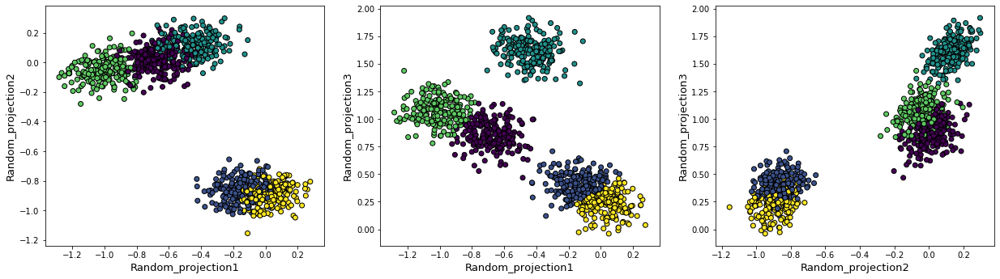

Score for iteration 9: -36.7095659459749
Silhouette score for iteration 9: 0.440297790612919
V-measure score for iteration 9: 0.7332105036307557
----------------------------------------------------------------------------------------------------


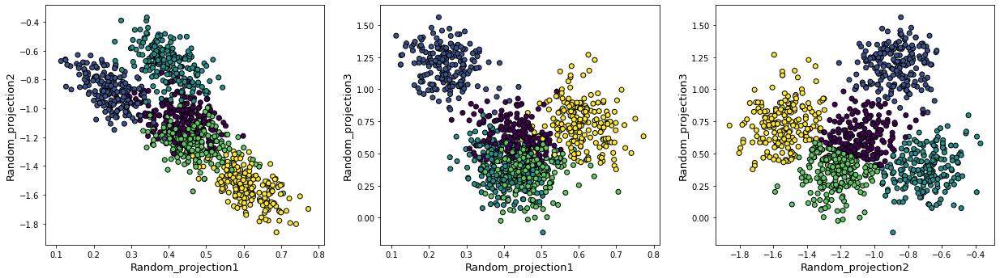

Score for iteration 10: -33.030023356862365
Silhouette score for iteration 10: 0.5323566774177816
V-measure score for iteration 10: 0.8389740627084183
----------------------------------------------------------------------------------------------------


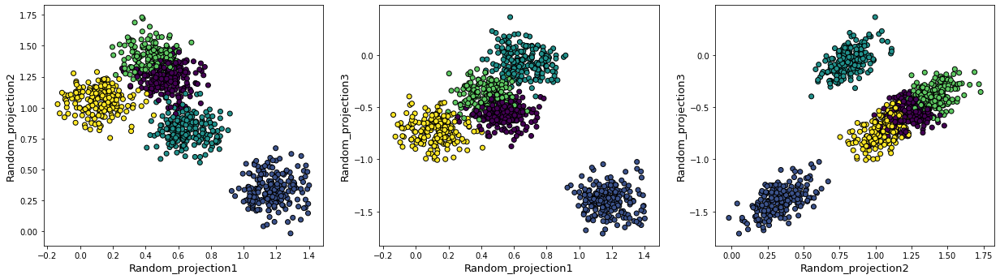

Score for iteration 11: -17.921143804913093
Silhouette score for iteration 11: 0.3799169308782382
V-measure score for iteration 11: 0.5511575763968278
----------------------------------------------------------------------------------------------------


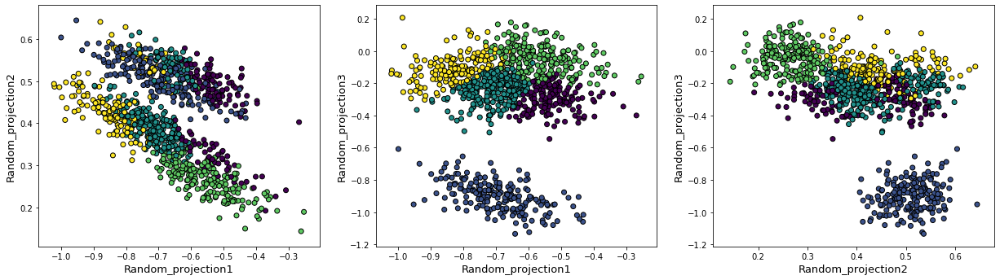

Score for iteration 12: -31.245477588856467
Silhouette score for iteration 12: 0.5519053034925141
V-measure score for iteration 12: 0.8967529931849991
----------------------------------------------------------------------------------------------------


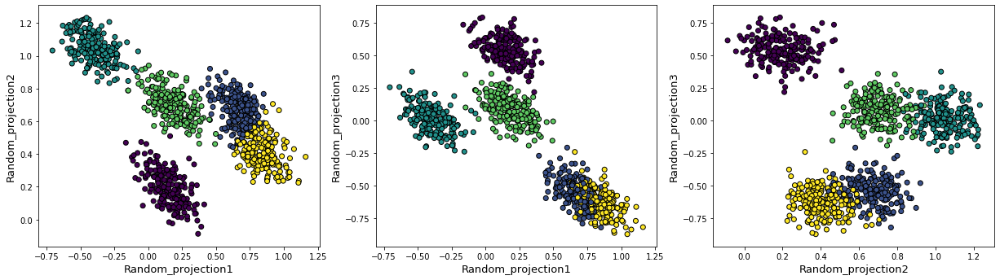

Score for iteration 13: -32.32596775269886
Silhouette score for iteration 13: 0.5304949334379694
V-measure score for iteration 13: 0.8505737014983149
----------------------------------------------------------------------------------------------------


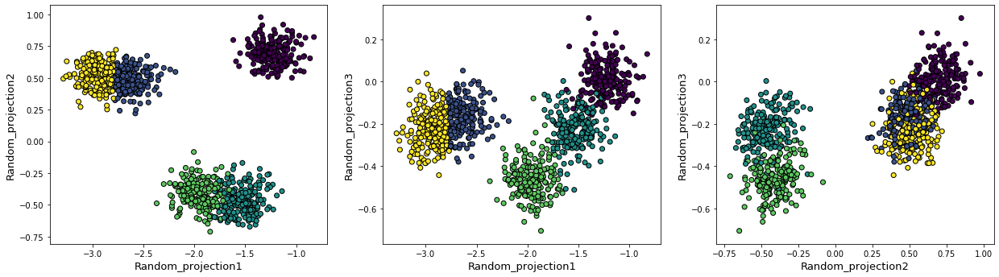

Score for iteration 14: -48.34432572895698
Silhouette score for iteration 14: 0.5744665383050438
V-measure score for iteration 14: 0.9470178235384016
----------------------------------------------------------------------------------------------------


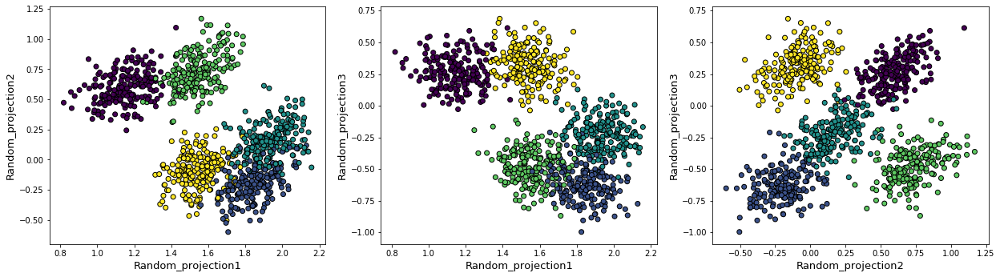

Score for iteration 15: -41.558066671920834
Silhouette score for iteration 15: 0.48528483545484424
V-measure score for iteration 15: 0.8120486101626418
----------------------------------------------------------------------------------------------------


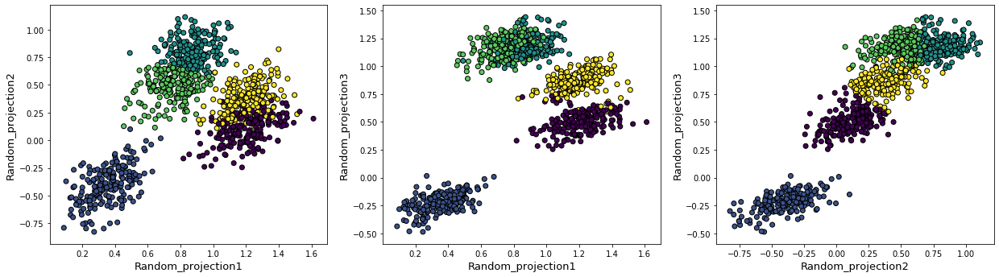

Score for iteration 16: -42.272915545624585
Silhouette score for iteration 16: 0.5171699738342302
V-measure score for iteration 16: 0.8845061132061536
----------------------------------------------------------------------------------------------------


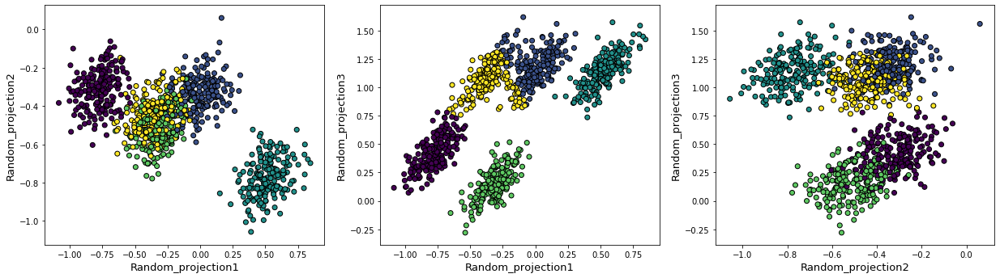

Score for iteration 17: -51.865654521782346
Silhouette score for iteration 17: 0.6029860301157847
V-measure score for iteration 17: 0.965166982172989
----------------------------------------------------------------------------------------------------


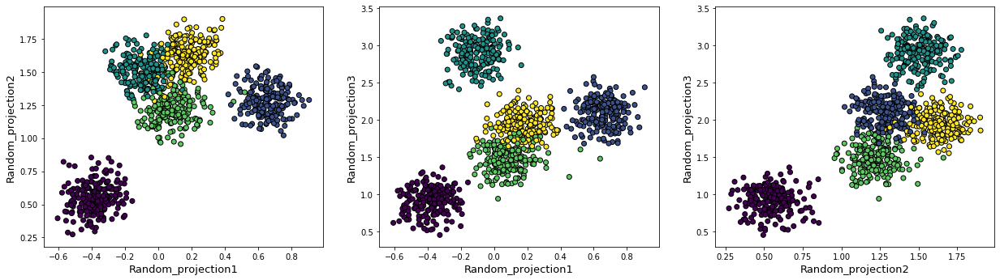

Score for iteration 18: -39.70870606625145
Silhouette score for iteration 18: 0.5414639342754736
V-measure score for iteration 18: 0.9067085198188041
----------------------------------------------------------------------------------------------------


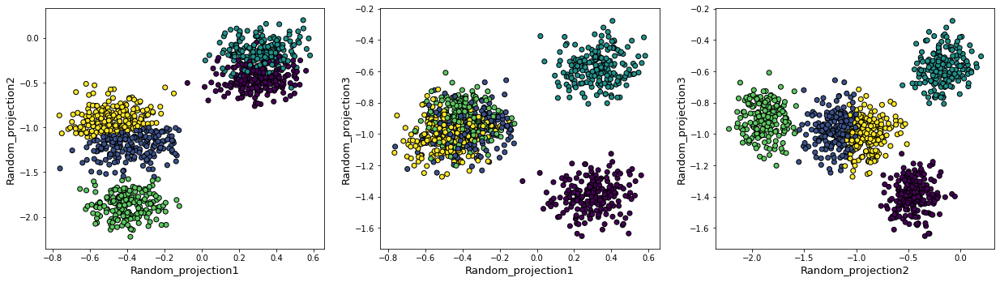

Score for iteration 19: -28.45705714733953
Silhouette score for iteration 19: 0.5301835293541879
V-measure score for iteration 19: 0.9489751172324872
----------------------------------------------------------------------------------------------------


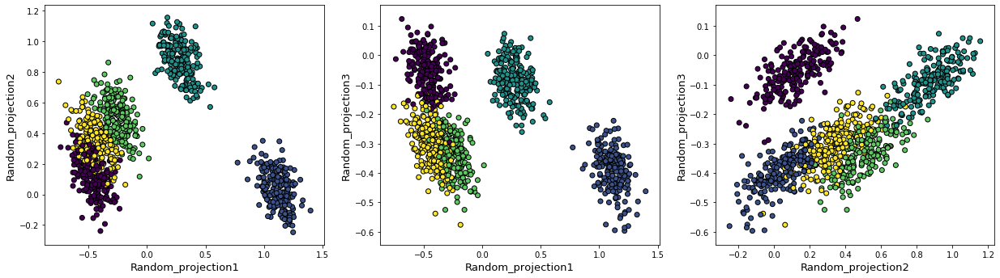

In [114]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

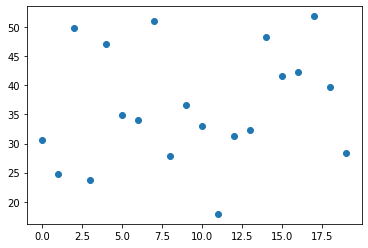

In [115]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

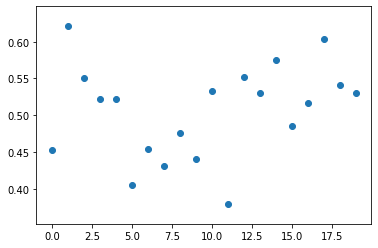

In [116]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

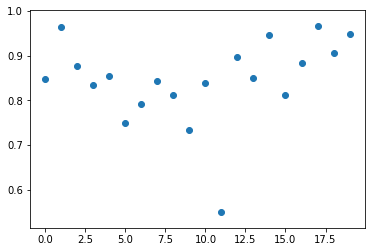

In [117]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [118]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -13.452592528249882
Silhouette score for iteration 0: 0.7098101194661651
V-measure score for iteration 0: 0.9793045468354543
----------------------------------------------------------------------------------------------------
Score for iteration 1: -13.452592528249882
Silhouette score for iteration 1: 0.7098101194661651
V-measure score for iteration 1: 0.9793045468354543
----------------------------------------------------------------------------------------------------
Score for iteration 2: -13.452592528249882
Silhouette score for iteration 2: 0.7098101194661651
V-measure score for iteration 2: 0.9793045468354543
----------------------------------------------------------------------------------------------------
Score for iteration 3: -13.452592528249882
Silhouette score for iteration 3: 0.7098101194661651
V-measure score for iteration 3: 0.9793045468354543
----------------------------------------------------------------------------------------------------
Scor